# Preparing and Saving the Cleaning Transcription

In [1]:
import pandas as pd
import numpy as np
df = pd.read_csv(r'Data/data.csv')
df.head()

,Description,Medical_Specialty,Sample_Name,Transcription,Keywords
0,A 23-year-old white female presents with comp...,Allergy / Immunology,Allergic Rhinitis,"SUBJECTIVE:, This 23-year-old white female pr...","allergy / immunology, allergic rhinitis, aller..."
1,Consult for laparoscopic gastric bypass.,Bariatrics,Laparoscopic Gastric Bypass Consult - 2,"PAST MEDICAL HISTORY:, He has difficulty climb...","bariatrics, laparoscopic gastric bypass, weigh..."
2,Consult for laparoscopic gastric bypass.,Bariatrics,Laparoscopic Gastric Bypass Consult - 1,"HISTORY OF PRESENT ILLNESS: , I have seen ABC ...","bariatrics, laparoscopic gastric bypass, heart..."
3,2-D M-Mode. Doppler.,Cardiovascular / Pulmonary,2-D Echocardiogram - 1,"2-D M-MODE: , ,1. Left atrial enlargement wit...","cardiovascular / pulmonary, 2-d m-mode, dopple..."
4,2-D Echocardiogram,Cardiovascular / Pulmonary,2-D Echocardiogram - 2,1. The left ventricular cavity size and wall ...,"cardiovascular / pulmonary, 2-d, doppler, echo..."


In [2]:
df = df.dropna()

In [3]:
import re

def clean_and_split_transcription(text):
    if isinstance(text, str):  # Check if the input is a string
        # Use regex to split the text into key-value pairs based on capitalized keys
        sections = re.split(r'(?<!\w)([A-Z\s]+):[\s,]*', text)  # Capture capitalized words before ':', and allow for spaces/commas

        cleaned_transcription = []

        # Loop through the sections and pair the headers with their content
        for i in range(1, len(sections), 2):  # Step by 2 to get header and content
            key = sections[i].strip()  # The section header
            value = sections[i + 1].strip() if i + 1 < len(sections) else ""  # The content right after the header
            
            # Clean the value: remove extra whitespace, trailing commas and periods
            value = re.sub(r'\s+', ' ', value)  # Replace multiple spaces with a single space
            value = re.sub(r'[,.\s]+$', '', value)  # Remove trailing commas, periods, and spaces
            
            cleaned_transcription.append({key: value})
        if len(cleaned_transcription) == 0:
            return text
        else:
            return cleaned_transcription
    else:
        return text

# Apply the function to the Transcription column
df['Cleaned_Transcription'] = df['Transcription'].apply(clean_and_split_transcription)

In [4]:
df['Cleaned_Transcription'][0]

[{'SUBJECTIVE': 'This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up'},
 {'MEDICATIONS': 'Her only medication currently is Ortho Tri-Cyclen and the Allegra'},
 {'ALLERGIES': 'She has no known medicine allergies'},
 {'OBJECTIVE': 'Vitals: Weight was 130 pounds and blood pressure 124/78'},
 {'HEENT': 'Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without 

In [5]:
df['Cleaned_Transcription'][10]

[{'PREOPERATIVE DIAGNOSIS': 'Morbid obesity'},
 {'POSTOPERATIVE DIAGNOSIS': 'Morbid obesity'},
 {'PROCEDURE': 'Laparoscopic Roux-en-Y gastric bypass, antecolic, antegastric with 25-mm EEA anastamosis, esophagogastroduodenoscopy'},
 {'ANESTHESIA': 'General with endotracheal intubation'},
 {'INDICATIONS FOR PROCEDURE': 'This is a 50-year-old male who has been overweight for many years and has tried multiple different weight loss diets and programs. The patient has now begun to have comorbidities related to the obesity. The patient has attended our bariatric seminar and met with our dietician and psychologist. The patient has read through our comprehensive handout and understands the risks and benefits of bypass surgery as evidenced by the signing of our consent form'},
 {'PROCEDURE IN DETAIL': 'The risks and benefits were explained to the patient. Consent was obtained. The patient was taken to the operating room and placed supine on the operating room table. General anesthesia was admini

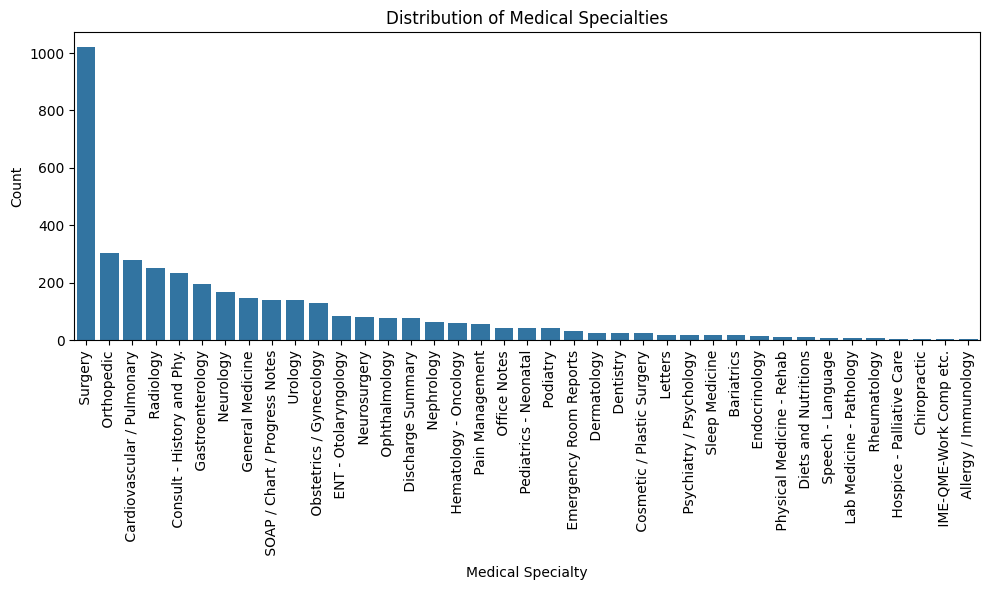

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,6))

specialty_counts = df['Medical_Specialty'].value_counts()

sns.barplot(x=specialty_counts.index, y=specialty_counts.values)

plt.xticks(rotation=90)
plt.xlabel('Medical Specialty')
plt.ylabel('Count')
plt.title('Distribution of Medical Specialties')

# Show the plot
plt.tight_layout()
plt.show()


In [9]:
df = df.rename(columns={'Sample_Name': 'Diagnosis'})
df = df.drop(columns=['Transcription'])
df.head()

,Description,Medical_Specialty,Diagnosis,Keywords,Cleaned_Transcription
0,A 23-year-old white female presents with comp...,Allergy / Immunology,Allergic Rhinitis,"allergy / immunology, allergic rhinitis, aller...",[{'SUBJECTIVE': 'This 23-year-old white female...
1,Consult for laparoscopic gastric bypass.,Bariatrics,Laparoscopic Gastric Bypass Consult - 2,"bariatrics, laparoscopic gastric bypass, weigh...",[{'PAST MEDICAL HISTORY': 'He has difficulty c...
2,Consult for laparoscopic gastric bypass.,Bariatrics,Laparoscopic Gastric Bypass Consult - 1,"bariatrics, laparoscopic gastric bypass, heart...",[{'HISTORY OF PRESENT ILLNESS': 'I have seen A...
3,2-D M-Mode. Doppler.,Cardiovascular / Pulmonary,2-D Echocardiogram - 1,"cardiovascular / pulmonary, 2-d m-mode, dopple...",[{'MODE': '1. Left atrial enlargement with lef...
4,2-D Echocardiogram,Cardiovascular / Pulmonary,2-D Echocardiogram - 2,"cardiovascular / pulmonary, 2-d, doppler, echo...",1. The left ventricular cavity size and wall ...


In [10]:
df.to_json('Data/cleaned_transcripts.json', index=False, orient='records')

# Starting the Chuncking process

In [11]:
import json
with open ("Data/cleaned_transcripts.json", "r") as file:
    cleaned_transcripts = json.load(file)

In [1]:
from tqdm import tqdm
from dotenv import load_dotenv
import os
# load_dotenv()
OPENAI_API_KEY = os.getenv("OPENAI_API_KEY")
PINECONE_API_KEY = os.getenv("PINECONE_API_KEY")
PINECONE_ENV = os.getenv("PINECONE_ENV")

In [14]:
import uuid
import json
from typing import List, Dict
from langchain.chat_models import ChatOpenAI
from langchain_core.prompts import ChatPromptTemplate, SystemMessagePromptTemplate, HumanMessagePromptTemplate

class ImprovedMedicalChunker:
    def __init__(self, openai_api_key=None):
        self.chunks = {}
        self.llm = ChatOpenAI(model='gpt-4o-mini', openai_api_key=openai_api_key, temperature=0)

    def process_transcript(self, transcript: Dict):
        patient_id = transcript.get('Patient_ID', str(uuid.uuid4())[:8])
        
        if patient_id not in self.chunks:
            self.chunks[patient_id] = {
                'patient_id': patient_id,
                'metadata': {},
                'sections': {},
                'summary': ''
            }
        
        self._add_metadata(patient_id, transcript)
        self._process_sections(patient_id, transcript['Cleaned_Transcription'])
        self._generate_summary(patient_id)

    def _add_metadata(self, patient_id, transcript):
        metadata = {
            'Description': transcript['Description'],
            'Medical_Specialty': transcript['Medical_Specialty'],
            'Diagnosis': transcript['Diagnosis'],
            'Keywords': transcript['Keywords']
        }
        self.chunks[patient_id]['metadata'] = metadata

    def _process_sections(self, patient_id, cleaned_transcription):
        if isinstance(cleaned_transcription, list):
            # Handle list of dictionaries
            for section in cleaned_transcription:
                if isinstance(section, dict):
                    for key, value in section.items():
                        self.chunks[patient_id]['sections'][key] = value
                else:
                    print(f"Warning: Unexpected item in list: {section}")
        elif isinstance(cleaned_transcription, dict):
            # Handle single dictionary
            for key, value in cleaned_transcription.items():
                self.chunks[patient_id]['sections'][key] = value
        elif isinstance(cleaned_transcription, str):
            # Handle plain text
            self.chunks[patient_id]['sections']['full_transcript'] = cleaned_transcription
        else:
            print(f"Warning: Unexpected type for cleaned_transcription: {type(cleaned_transcription)}")

    def _generate_summary(self, patient_id):
        chunk = self.chunks[patient_id]
        prompt = ChatPromptTemplate.from_messages([
            SystemMessagePromptTemplate.from_template(
                "You are a medical professional summarizing patient information. "
                "Create a concise summary focusing on key diagnoses, treatments, and observations."
            ),
            HumanMessagePromptTemplate.from_template(
                "Patient Information:\n{patient_info}\n\n"
                "Generate a brief summary of this patient's medical situation."
            )
        ])
        
        patient_info = (
            f"Metadata: {json.dumps(chunk['metadata'], indent=2)}\n"
            f"Sections: {json.dumps(chunk['sections'], indent=2)}"
        )
        
        result = self.llm(prompt.format_messages(patient_info=patient_info))
        self.chunks[patient_id]['summary'] = result.content

    def get_chunks(self):
        return self.chunks

    def pretty_print_chunks(self):
        for patient_id, chunk in self.chunks.items():
            print(f"\nPatient ID: {patient_id}")
            print(f"Metadata: {json.dumps(chunk['metadata'], indent=2)}")
            print("Sections:")
            for section, content in chunk['sections'].items():
                print(f"  {section}: {content[:100]}...")
            print(f"Summary: {chunk['summary']}")
            print("-" * 50)

def process_transcripts(transcripts: List[Dict], openai_api_key: str) -> Dict:
    chunker = ImprovedMedicalChunker(openai_api_key)
    for transcript in transcripts:
        chunker.process_transcript(transcript)
    return chunker.get_chunks()

# Usage
if __name__ == "__main__":
    chunker = ImprovedMedicalChunker(OPENAI_API_KEY)
    for transcript in cleaned_transcripts:
        chunker.process_transcript(transcript)
    
    chunked_documents = chunker.get_chunks()
    print(f"Total patients processed: {len(chunked_documents)}")
    
    # Print the chunks
    chunker.pretty_print_chunks()

Total patients processed: 3898

Patient ID: f4b4cbc8
Metadata: {
  "Description": " A 23-year-old white female presents with complaint of allergies.",
  "Medical_Specialty": " Allergy / Immunology",
  "Diagnosis": " Allergic Rhinitis ",
  "Keywords": "allergy / immunology, allergic rhinitis, allergies, asthma, nasal sprays, rhinitis, nasal, erythematous, allegra, sprays, allergic,"
}
Sections:
  SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when ...
  MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra...
  ALLERGIES: She has no known medicine allergies...
  OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78...
  HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only ...
  ASSESSMENT: Allergic rhinitis...
  PLAN: 1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does ...
Summary: **Patien

In [15]:
chunked_documents

{'f4b4cbc8': {'patient_id': 'f4b4cbc8',
  'metadata': {'Description': ' A 23-year-old white female presents with complaint of allergies.',
   'Medical_Specialty': ' Allergy / Immunology',
   'Diagnosis': ' Allergic Rhinitis ',
   'Keywords': 'allergy / immunology, allergic rhinitis, allergies, asthma, nasal sprays, rhinitis, nasal, erythematous, allegra, sprays, allergic,'},
  'sections': {'SUBJECTIVE': 'This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up',
 

In [16]:
with open('Data/chunked_documents.json', 'w') as outfile:
    json.dump(chunked_documents, outfile, indent=4)

print("chunked_documents saved to 'Data/chunked_documents.json'")

chunked_documents saved to 'Data/chunked_documents.json'


# Starting the embeddings process

In [ ]:
# from pinecone import Pinecone, ServerlessSpec

# pc = Pinecone(api_key=PINECONE_API_KEY)

# index_name = "medicalbot"

# pc.create_index(
#     name=index_name,
#     dimension=1536, 
#     metric="cosine",
#     spec=ServerlessSpec(
#         cloud="aws",
#         region=PINECONE_ENV
#     ) 
# )

In [3]:
import json
import time
from tqdm.autonotebook import tqdm
from langchain.embeddings.openai import OpenAIEmbeddings
from pinecone import Pinecone
import tenacity

def flatten_metadata(metadata):
    flattened = {}
    for key, value in metadata.items():
        if isinstance(value, (str, int, float, bool)):
            flattened[key] = value
        elif isinstance(value, list) and all(isinstance(item, str) for item in value):
            flattened[key] = value
        else:
            flattened[key] = str(value)
    return flattened

@tenacity.retry(wait=tenacity.wait_exponential(multiplier=1, min=4, max=10),
                stop=tenacity.stop_after_attempt(5),
                retry=tenacity.retry_if_exception_type((Exception,)))
def create_embedding_with_backoff(embeddings, text):
    return embeddings.embed_query(text)

@tenacity.retry(wait=tenacity.wait_exponential(multiplier=1, min=4, max=10),
                stop=tenacity.stop_after_attempt(5),
                retry=tenacity.retry_if_exception_type((Exception,)))
def upsert_to_pinecone_with_backoff(index, vectors):
    index.upsert(vectors=vectors)

def create_embeddings_and_store_in_pinecone(chunks, openai_api_key, pinecone_api_key, index_name, batch_size=100):
    embeddings = OpenAIEmbeddings(openai_api_key=openai_api_key)
    pc = Pinecone(api_key=pinecone_api_key)
    index = pc.Index(index_name)
    
    batch = []
    for patient_id, chunk in tqdm(chunks.items(), desc="Processing chunks"):
        text = json.dumps(chunk['metadata']) + " " + chunk['summary']
        try:
            embedding = create_embedding_with_backoff(embeddings, text)
            flattened_metadata = flatten_metadata(chunk['metadata'])
            batch.append((patient_id, embedding, {
                "metadata": json.dumps(flattened_metadata),
                "summary": chunk['summary']
            }))
            
            if len(batch) >= batch_size:
                upsert_to_pinecone_with_backoff(index, batch)
                batch = []
        except Exception as e:
            print(f"Error processing chunk for patient {patient_id}: {str(e)}")
    
    if batch:  # Upsert any remaining items
        upsert_to_pinecone_with_backoff(index, batch)
    
    print(f"Stored {len(chunks)} embeddings in Pinecone index '{index_name}'")

# Load chunked documents
with open('Data/chunked_documents.json', 'r') as infile:
    chunked_documents = json.load(infile)

# Create embeddings and store in Pinecone
create_embeddings_and_store_in_pinecone(chunked_documents, OPENAI_API_KEY, PINECONE_API_KEY, index_name="medicalbot")
print("Embedding creation and storage complete.")

/var/folders/zk/ls5wtq6s1s9c89z165cvqslm0000gq/T/ipykernel_83587/2934213134.py:32: LangChainDeprecationWarning: The class `OpenAIEmbeddings` was deprecated in LangChain 0.0.9 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-openai package and should be used instead. To use it run `pip install -U :class:`~langchain-openai` and import as `from :class:`~langchain_openai import OpenAIEmbeddings``.
  embeddings = OpenAIEmbeddings(openai_api_key=openai_api_key)


Processing chunks:   0%|          | 0/3898 [00:00<?, ?it/s]

Stored 3898 embeddings in Pinecone index 'medicalbot'
Embedding creation and storage complete.


# Medical Bot

In [2]:
from tqdm import tqdm
from dotenv import load_dotenv
import os
# load_dotenv()
OPENAI_API_KEY = os.getenv("OPENAI_API_KEY")
PINECONE_API_KEY = os.getenv("PINECONE_API_KEY")
PINECONE_ENV = os.getenv("PINECONE_ENV")

In [14]:
from pinecone import Pinecone
from langchain.embeddings.openai import OpenAIEmbeddings
from langchain_pinecone import PineconeVectorStore
from langchain_openai import ChatOpenAI
from langchain.chains import LLMChain
from langchain.prompts import ChatPromptTemplate
from langchain.memory import ConversationBufferMemory
from langchain.schema import SystemMessage
from langchain_core.runnables import RunnablePassthrough, RunnableSequence

# Initialize Pinecone
pc = Pinecone(api_key=PINECONE_API_KEY)
index_name = "medicalbot"
embeddings = OpenAIEmbeddings(openai_api_key=OPENAI_API_KEY)

# Initialize PineconeVectorStore
vectorstore = PineconeVectorStore(
    index=pc.Index(index_name),
    embedding=embeddings,
    text_key="summary"
)

/opt/anaconda3/envs/medicalbot/lib/python3.10/site-packages/pinecone/data/index.py:1: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm
/var/folders/zk/ls5wtq6s1s9c89z165cvqslm0000gq/T/ipykernel_38666/414876463.py:14: LangChainDeprecationWarning: The class `OpenAIEmbeddings` was deprecated in LangChain 0.0.9 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-openai package and should be used instead. To use it run `pip install -U :class:`~langchain-openai` and import as `from :class:`~langchain_openai import OpenAIEmbeddings``.
  embeddings = OpenAIEmbeddings(openai_api_key=OPENAI_API_KEY)


In [15]:
from langchain.schema import BaseRetriever
from langchain.schema.document import Document
from typing import List
import json
from pydantic import Field, PrivateAttr

class EnhancedRetriever(BaseRetriever):
    top_k: int = Field(default=5, description="Number of top results to return")
    _vectorstore: PineconeVectorStore = PrivateAttr()

    def __init__(self, vectorstore: PineconeVectorStore, top_k: int = 5):
        super().__init__()
        self._vectorstore = vectorstore
        self.top_k = top_k

    def _get_relevant_documents(self, query: str) -> List[Document]:
        results = self._vectorstore.similarity_search(query, k=self.top_k*2)
        
        processed_results = []
        for doc in results:
            try:
                metadata = json.loads(doc.metadata['metadata'].replace("'", '"'))
            except (json.JSONDecodeError, KeyError):
                metadata = {}
            
            keywords = metadata.get('Keywords', '').lower().split(', ')
            query_words = query.lower().split()
            keyword_score = sum(1 for word in query_words if word in keywords)
            
            combined_score = doc.metadata.get('score', 0) + (keyword_score * 0.1)
            
            processed_results.append({
                'document': doc,
                'combined_score': combined_score
            })
        
        top_results = sorted(processed_results, key=lambda x: x['combined_score'], reverse=True)[:self.top_k]
        return [item['document'] for item in top_results]

    async def _aget_relevant_documents(self, query: str) -> List[Document]:
        return self._get_relevant_documents(query)

# Usage
retriever = EnhancedRetriever(vectorstore, top_k=5)

# Trail QA Chain

In [16]:
from langchain_openai import ChatOpenAI
from langchain_core.prompts import ChatPromptTemplate

llm = ChatOpenAI(model_name="gpt-4o-mini")

medical_prompt = ChatPromptTemplate.from_template(
"""
You are a medical assistant bot. Answer the following question based on the given medical transcriptions. If you don't have enough information to answer accurately, say so.
Suggest which healthcare professional they need to consult.
Remember you are medical chatbot designed for natural human interaction and answer their questions.
1) To determine their diagnosis
2) Help them understand next steps 
3) Answer any and all questions they ask within your knowledge.
4) If someone tries to misuse or ask question distubring questions disengage in conversation professionally.

Medical Trancriptions For Reference: 
{context}

Patient Question: {input}
""")

In [17]:
from langchain.chains import create_retrieval_chain
from langchain.chains.combine_documents import create_stuff_documents_chain
from langchain_core.runnables import RunnablePassthrough

document_chain = create_stuff_documents_chain(llm, medical_prompt)
qa_chain = create_retrieval_chain(retriever, document_chain)

def query_medical_bot(patient_query):
    response = qa_chain.invoke({"input": patient_query})
    answer = response['answer']
    context = response.get('context', [])
    # Add a disclaimer
    disclaimer = "\n\nNote: This information is for educational purposes only and does not constitute medical advice. Please consult with a healthcare professional for personalized medical guidance."
    return answer + disclaimer, context

In [18]:
# Example usage
patient_query = "Tell me about the signs and symptoms a doctor should look for or examine in a patient to know if they have diabetes?"
answer, context = query_medical_bot(patient_query)
print("Answer:", answer)
print("\nRelevant Context:")
for doc in context:
    print(f"- {doc.page_content}")

Answer: To identify if a patient has diabetes, a healthcare professional will look for several signs and symptoms. Common signs and symptoms of diabetes include:

1. **Increased Thirst (Polydipsia):** Patients may feel excessively thirsty and may drink more fluids than usual.

2. **Frequent Urination (Polyuria):** Increased urination, especially at night, can be a sign as the body attempts to eliminate excess glucose through urine.

3. **Increased Hunger (Polyphagia):** Despite eating, patients may feel hungry due to the body’s inability to effectively use glucose for energy.

4. **Fatigue:** People with diabetes often feel tired and fatigued, which can be due to the body’s inability to use glucose properly.

5. **Blurred Vision:** Fluctuations in blood sugar levels can affect eyesight and cause temporary changes in vision.

6. **Slow Healing:** Cuts and bruises may take longer to heal, and there may be frequent infections.

7. **Tingling or Numbness:** Some patients experience tinglin